# Konwolucja 2D

## Jak to działa
![animation](https://upload.wikimedia.org/wikipedia/commons/1/19/2D_Convolution_Animation.gif)

## Filtry

### Dolnoprzepustowe (wygładzające)
Filtry dolnoprzepustowe (ang. low-pass) przepuszczają elementy obrazu o małej częstotliwości. Elementy o wysokiej częstotliwości (szumy, drobne szczegóły) są natomiast tłumione bądź wręcz blokowane. Wynikiem działania takich fitrów jest zredukowanie szumów, w szczególności gdy jest on jedno, dwupikslowy ale również wygładzenie i rozmycie obrazu. Poniżej znajduje się przykładowy obraz przed (po lewej) i po zastosowaniu filtra dolnoprzepustowego:

#### Filtr uśredniający
podstawowy filtr dolnoprzepustowy, jego wynikiem jest uśrednienie każdego piksela razem ze swoimi ośmioma sąsiadami.

$$
\frac{1}{9}\begin{bmatrix}
1 & 1 & 1 \\
1 & 1 & 1 \\
1 & 1 & 1
\end{bmatrix}
$$

#### Filtr kwadratowy
jego wynikiem jest uśrednienie każdego piksla razem ze swoimi dwudziestoma czteroma sąsiadami, powoduje to odfiltrowanie większej liczby szczegółów jak w przypadku poprzedniego filtra.

$$
\begin{bmatrix}
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1
\end{bmatrix}
$$

#### Filtr kołowy
jest pewną modyfikacją filtra kwadratowego, kształt jego maski zbliżony jest do koła, jego wynikiem jest uśrednienie każdego piksla razem ze swoimi dwudziestoma sąsiadami - punkty położone w narożnikach mają wagę 0, zatem nie biorą udziału w procesie filtracji.

$$
\begin{bmatrix}
0 & 1 & 1 & 1 & 0 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
1 & 1 & 1 & 1 & 1 \\
0 & 1 & 1 & 1 & 0
\end{bmatrix}
$$

#### LP1,2,3
różni się od filtra uśredniającego zwiększeniem wagi, dla aktualnie przetwarzanego punktu, powoduje to zmniejszenie "efektu rozmycia" w stosunku do filtra uśredniającego.

$$
\begin{bmatrix}
1 & 1 & 1 \\
1 & 2 & 1 \\
1 & 1 & 1
\end{bmatrix}
\begin{bmatrix}
1 & 1 & 1 \\
1 & 4 & 1 \\
1 & 1 & 1
\end{bmatrix}
\begin{bmatrix}
1 & 1 & 1 \\
1 & 12 & 1 \\
1 & 1 & 1
\end{bmatrix}
$$

#### filtr gaussa
jeżeli kolejne komórki tego filtra przedstawionoby za pomocą słupków o wysokości odpowiadającej przypisanej wadze to w efekcie otrzymalibyśmy bryłę podobną do krzywej rozkładu normalnego - krzywej Gaussa. Zatem znaczenie wartości punktu rośnie wraz ze zmniejszaniem się odległości do obliczanego punktu, w sposób opisany przez funkcje Gaussa.

$$
\begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
\begin{bmatrix}
1 & 1 & 2 & 1 & 1 \\
1 & 2 & 4 & 2 & 1 \\
2 & 4 & 8 & 4 & 2 \\
1 & 2 & 4 & 2 & 1 \\
1 & 1 & 2 & 1 & 1
\end{bmatrix}
$$

### High pass filters (sharpening)
#### Sharpen:
$$
\begin{bmatrix}
0 & -1 & 0 \\
-1 & 5 & -1 \\
0 & -1 & 0
\end{bmatrix}
$$
### Edge detection filters
#### Sobel filter (directional)
##### Horizontal
$$
\begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$
##### Vertical
$$
\begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$
#### Laplacian filter
$$
\begin{bmatrix}
0 & -1 & 0 \\
-1 & 4 & -1 \\
0 & -1 & 0
\end{bmatrix}
$$


In [36]:
# define filters

import numpy as np

filter_mean_3 = np.ones((3, 3)) * (1 / 9)
filter_mean_5 = np.ones((5, 5)) * (1 / 25)
filter_mean_7 = np.ones((7, 7)) * (1 / 49)

filter_gaussian_3 = np.array(
    [
        [1, 2, 1],
        [2, 4, 2],
        [1, 2, 1],
    ]
)

filter_gaussian_5 = np.array(
    [
        [1, 1, 2, 1, 1],
        [1, 2, 4, 2, 1],
        [2, 4, 8, 4, 2],
        [1, 2, 4, 2, 1],
        [1, 1, 2, 1, 1],
    ]
)

filter_gaussian_7 = np.array(
    [
        [1, 1, 2, 2, 2, 1, 1],
        [1, 2, 2, 4, 2, 2, 1],
        [2, 2, 4, 8, 4, 2, 2],
        [2, 4, 8, 16, 8, 4, 2],
        [2, 2, 4, 8, 4, 2, 2],
        [1, 2, 2, 4, 2, 2, 1],
        [1, 1, 2, 2, 2, 1, 1],
    ]
)
filter_gaussian_3 = filter_gaussian_3 / filter_gaussian_3.sum()
filter_gaussian_5 = filter_gaussian_5 / filter_gaussian_5.sum()
filter_gaussian_7 = filter_gaussian_7 / filter_gaussian_7.sum()

filter_sharpen = np.array(
    [
        [0, -1, 0],
        [-1, 5, -1],
        [0, -1, 0],
    ]
)

filter_mean_removal = np.array(
    [
        [-1, -1, -1],
        [-1, 9, -1],
        [-1, -1, -1],
    ]
)

filter_emboss_east = np.array(
    [
        [-1, 0, 1],
        [-1, 1, 1],
        [-1, 0, 1],
    ]
)

filter_emboss_south = np.array(
    [
        [-1, -1, -1],
        [0, 1, 0],
        [1, 1, 1],
    ]
)

filter_sobel_x = np.array(
    [
        [-1, 0, 1],
        [-2, 0, 2],
        [-1, 0, 1],
    ]
)

filter_sobel_y = np.array(
    [
        [-1, -2, -1],
        [0, 0, 0],
        [1, 2, 1],
    ]
)

filter_laplacian = np.array(
    [
        [0, 1, 0],
        [1, -4, 1],
        [0, 1, 0],
    ]
)

# List of filters and their names
filters = [
    (filter_mean_3, 'Mean Filter 3x3'),
    (filter_mean_5, 'Mean Filter 5x5'),
    (filter_mean_7, 'Mean Filter 7x7'),
    (filter_gaussian_3, 'Gaussian Filter 3x3'),
    (filter_gaussian_5, 'Gaussian Filter 5x5'),
    (filter_gaussian_7, 'Gaussian Filter 7x7'),
    (filter_sharpen, 'Sharpen Filter (high-pass filter)'),
    (filter_mean_removal, 'Mean Removal Filter'),
    (filter_emboss_east, 'Emboss East Filter'),
    (filter_emboss_south, 'Emboss South Filter'),
    (filter_sobel_x, 'Sobel X Filter'),
    (filter_sobel_y, 'Sobel Y Filter'),
    (filter_laplacian, 'Laplacian Filter'),
]


In [ ]:
import numpy as np
import numpy.typing as npt

def conv2d(image: npt.NDArray, filter: npt.NDArray) -> npt.NDArray:
    """
    Apply a 2D convolution operation to an image using a given filter.

    Parameters:
    image (npt.NDArray): The input image as a 3D NumPy array (height, width, channels).
    filter (npt.NDArray): The convolution filter as a 2D NumPy array.

    Returns:
    npt.NDArray: The resulting image after applying the convolution.
    """
    # Add padding to the image
    filter_size = filter.shape[0]
    pad_size = filter_size // 2
    padded_image = np.pad(image, ((pad_size, pad_size), (pad_size, pad_size), (0, 0)), mode='constant')

    # Get shape of the image
    width, height, channels = image.shape
    # Initialize the result image
    result = np.zeros((width, height, channels))
    
    for c in range(channels):
        for i in range(width):
            for j in range(height):
                result[i, j, c] = np.sum(padded_image[i:i+filter_size, j:j+filter_size, c] * filter)
    
    return result

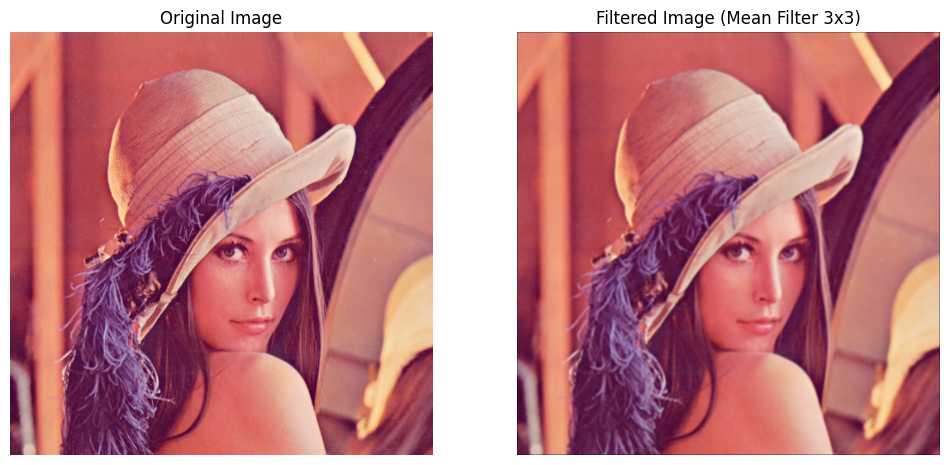

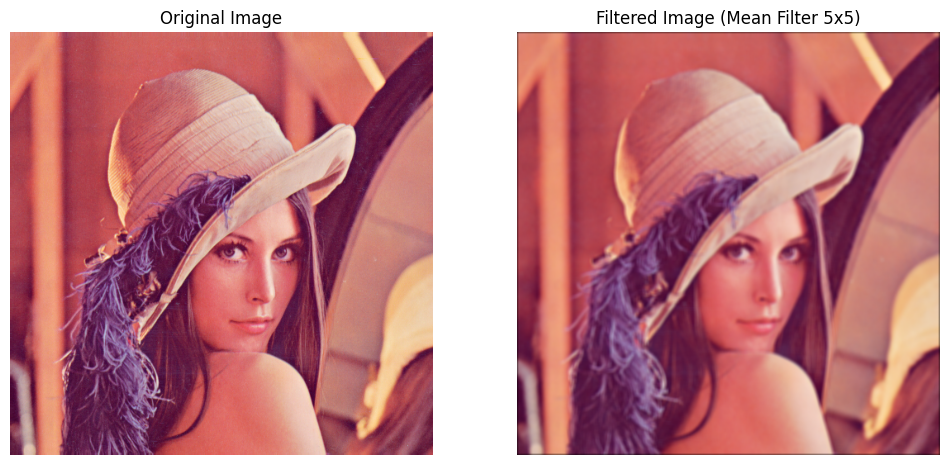

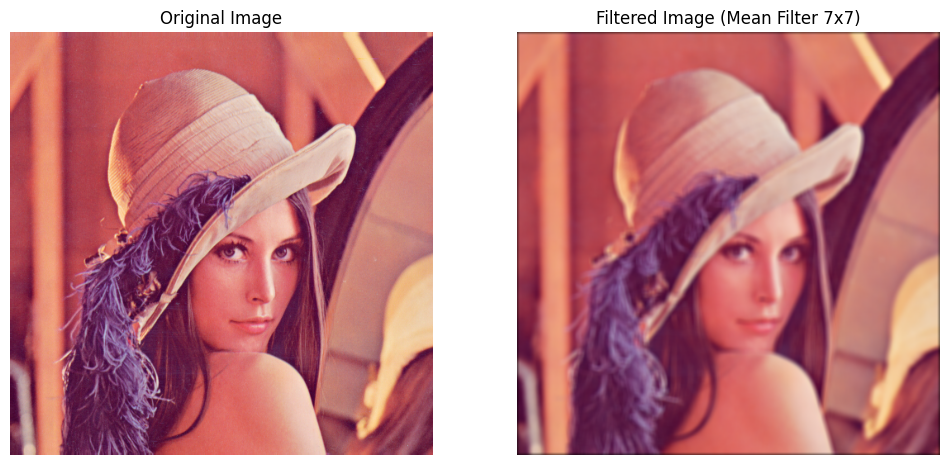

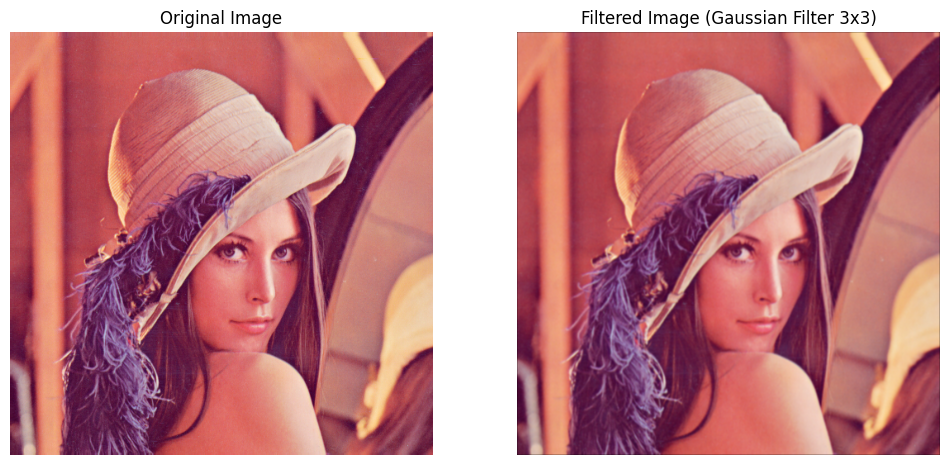

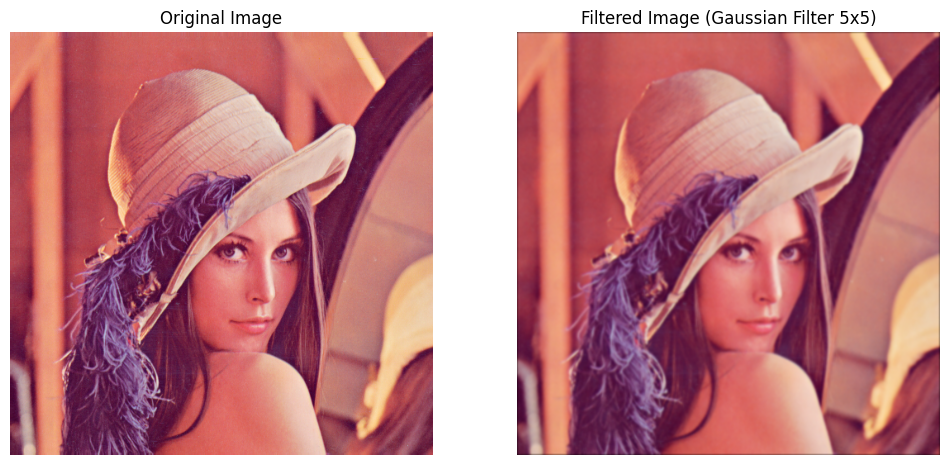

...

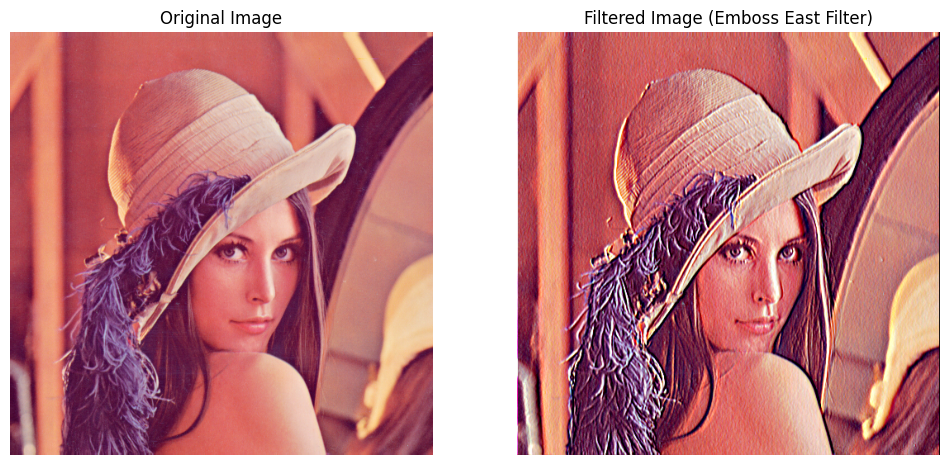

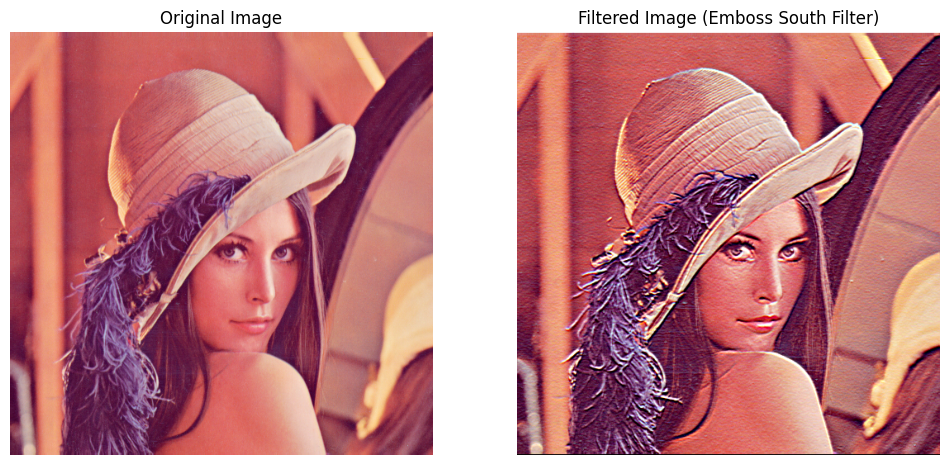

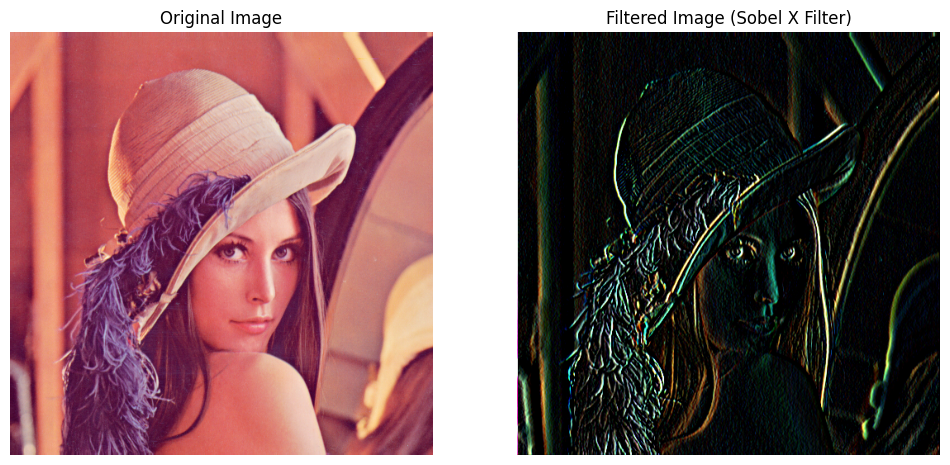

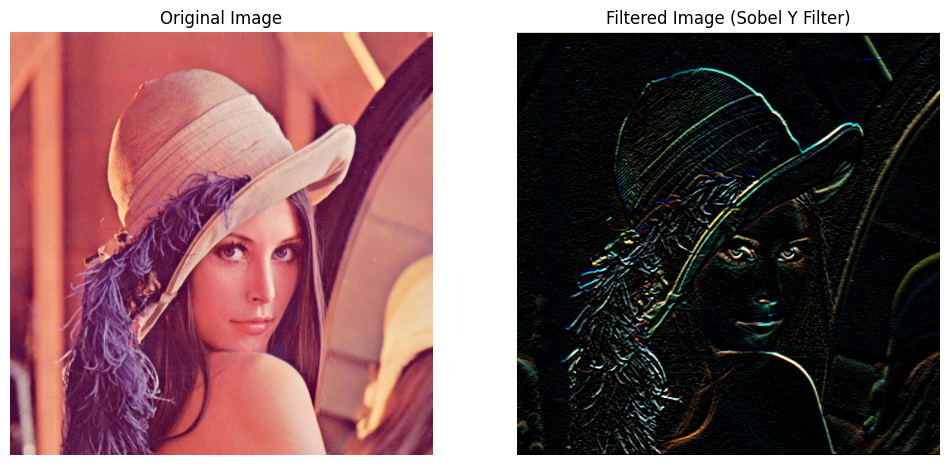

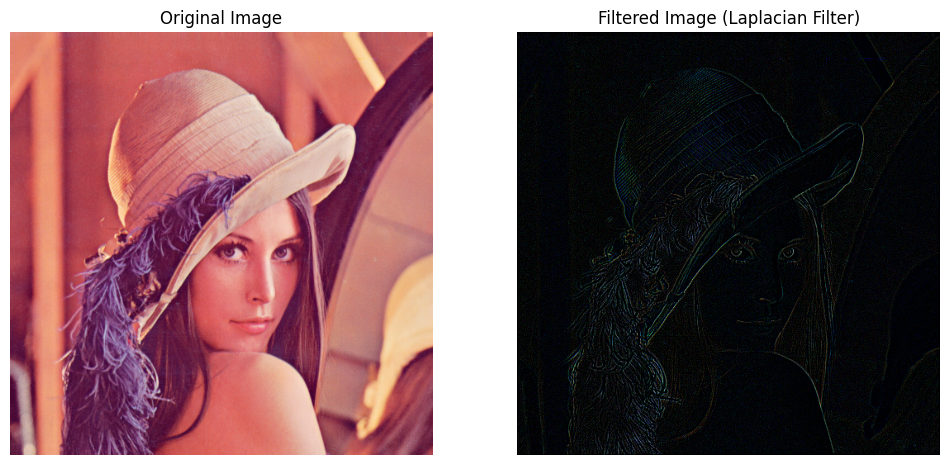

In [38]:
# 2D convolution examples

from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# load image from file to numpy array
image = Image.open('lenna.png')
image = np.array(image)

# Apply each filter and display the result
for filter, filter_name in filters:
    result = conv2d(image, filter)
    result_clipped = np.clip(result, 0, 255).astype(np.uint8)
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Original image
    axes[0].imshow(image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')  # Remove axes for better visualization
    
    # Result image
    axes[1].imshow(result_clipped)
    axes[1].set_title(f'Filtered Image ({filter_name})')
    axes[1].axis('off')  # Remove axes for better visualization
    
    plt.show()
